# Load Packages + Filepath

In [4]:
# Load Packages
import xarray as xr
import numpy as np
import pandas as pd
import xesmf as xe
import xcdat as xc

from matplotlib import pyplot as plt
from matplotlib.gridspec import GridSpec
from mpl_toolkits.basemap import Basemap
import matplotlib.dates as mdates

import cartopy.crs as ccrs
import cartopy.feature as cfeature

from scipy import stats
from scipy.stats import pearsonr
from scipy.stats import zscore
from scipy.stats import t
from scipy.signal import butter, filtfilt, detrend, welch

from statsmodels.api import OLS, add_constant

In [5]:
input_filepath1 = "../../data/"
input_filepath2 = "../../data/created/"

In [6]:
%load_ext autoreload
%autoreload 2

# Load Local Utils
import plotting_utils
import index_utils

# Load LONG TERM VARS + Indexes [1903-2023]
SST [OCEAN], PDSI[LAND], PPT [LAND]

In [7]:
SST_Anom_1903_2023 = xr.open_dataset("created/SST_Anom_1903_2023.nc")
SST_Anom_1903_2023

<xarray.Dataset> Size: 251MB
Dimensions:         (lat: 180, lon: 360, bnds: 2, time: 484)
Coordinates:
  * lat             (lat) float32 720B 89.5 88.5 87.5 86.5 ... -87.5 -88.5 -89.5
  * lon             (lon) float32 1kB -179.5 -178.5 -177.5 ... 177.5 178.5 179.5
  * time            (time) datetime64[ns] 4kB 1902-12-01 ... 2023-09-01
Dimensions without coordinates: bnds
Data variables:
    longitude_bnds  (lon, bnds) float32 3kB ...
    latitude_bnds   (lat, bnds) float32 1kB ...
    sst_anom        (time, lat, lon) float64 251MB ...
Attributes:
    Title:                      Monthly version of HadISST sea surface temper...
    description:                HadISST 1.1 monthly average sea surface tempe...
    institution:                Met Office Hadley Centre
    source:                     HadISST
    reference:                  Rayner, N. A., Parker, D. E., Horton, E. B., ...
    Conventions:                CF-1.0
    history:                    4/11/2024 converted to netcdf from pp format
    supplementary_information:  Updates and supplementary information will be...
    comment:                    Data restrictions: for academic research use ...

In [8]:
PDSI_Anom_1903_2023 = xr.open_dataset("created/PDSI_Anom_1903_2023.nc")
PDSI_Anom_1903_2023

<xarray.Dataset> Size: 2GB
Dimensions:      (time: 484, lat: 280, lon: 720)
Coordinates:
  * lon          (lon) float64 6kB -179.8 -179.2 -178.8 ... 178.8 179.2 179.8
  * lat          (lat) float64 2kB 69.75 69.25 68.75 ... -68.75 -69.25 -69.75
  * time         (time) datetime64[ns] 4kB 1902-12-01 1903-03-01 ... 2023-09-01
Data variables:
    scpdsi       (time, lat, lon) float64 781MB ...
    pdsi_masked  (time, lat, lon) float64 781MB ...
Attributes:
    creation_date:                             24-Feb-2024 19:00:56
    Institution:                               Climatic Research Unit, Univer...
    creator:                                   Prof. Jonathan Barichivich (jo...
    Original reference for computation setup:  van der Schrier G, Barichivich...
    Updated reference:                         J. Barichivich, Osborn TJ, Har...

In [36]:
PPT_Anom_1903_2023 = xr.open_dataset("created/PPT_Anom_1903_2023.nc")
PPT_Anom_1903_2023

<xarray.Dataset> Size: 781MB
Dimensions:  (lon: 720, lat: 280, time: 484)
Coordinates:
  * lon      (lon) float32 3kB -179.8 -179.2 -178.8 -178.2 ... 178.8 179.2 179.8
  * lat      (lat) float32 1kB 69.75 69.25 68.75 68.25 ... -68.75 -69.25 -69.75
  * time     (time) datetime64[ns] 4kB 1902-12-01 1903-03-01 ... 2023-09-01
Data variables:
    pre      (time, lat, lon) float64 781MB ...

In [10]:
TMP_Anom_1903_2023 = xr.open_dataset("created/TMP_Anom_1903_2023.nc")
TMP_Anom_1903_2023

<xarray.Dataset> Size: 1GB
Dimensions:   (lon: 720, lat: 360, bnds: 2, time: 484)
Coordinates:
  * lon       (lon) float32 3kB -179.8 -179.2 -178.8 ... 178.8 179.2 179.8
  * lat       (lat) float32 1kB -89.75 -89.25 -88.75 ... 88.75 89.25 89.75
  * time      (time) datetime64[ns] 4kB 1902-12-01 1903-03-01 ... 2023-09-01
Dimensions without coordinates: bnds
Data variables:
    lon_bnds  (lon, bnds) float32 6kB ...
    lat_bnds  (lat, bnds) float32 3kB ...
    tmp_anom  (time, lat, lon) float64 1GB ...
Attributes:
    Conventions:  CF-1.4
    title:        CRU TS4.09 Mean Temperature
    institution:  Data held at British Atmospheric Data Centre, RAL, UK.
    source:       Run ID = 2503051245. Data generated from:tmp.2503051121.dtb
    history:      Wed  5 Mar 13:28:04 GMT 2025 : User f098 : Program makegrid...
    references:   Information on the data is available at http://badc.nerc.ac...
    comment:      Access to these data is available to any registered CEDA user.
    contact:      support@ceda.ac.uk

In [17]:
sst_seasonal_indices_z = xr.open_dataset("created/sst_seasonal_indices_z.nc")
sst_seasonal_indices_z

<xarray.Dataset> Size: 14kB
Dimensions:  (time: 484)
Coordinates:
  * time     (time) datetime64[ns] 4kB 1902-12-01 1903-03-01 ... 2023-09-01
Data variables:
    ENSO     (time) float32 2kB ...
    IOD      (time) float32 2kB ...
    PDO      (time) float64 4kB ...
    AMO      (time) float32 2kB ...
Attributes:
    description:  Standardized seasonal (z-score) indices of ENSO, IOD, PDO, AMO
    note:         Each variable is grouped by time.season

# Regression

In [12]:
years_1903_2023 = np.arange(1903, 2024, 1)

def detrend_dim(da, dim):
    # detrend along a single dimension
    p = da.polyfit(dim=dim, deg=1)
    fit = xr.polyval(da[dim], p.polyfit_coefficients)
    return da - fit

In [57]:
def compute_and_plot_reg_with_corrs_p_MOV(idx_values,
                           pdsi_anoms_seasonal, 
                           sst_anoms_seasonal,
                           years, seasons,
                           cmap_pdsi='BrBG', vlim_pdsi=0.5,
                           cmap_sst='RdBu_r', vlim_sst=0.5,
                           overall_title = "Regession with Correlation P",
                           coeff_label='Regression'):

    pdsi_reg_dt = []
    sst_reg_dt = []
    pdsi_pvals_dt = []
    sst_pvals_dt = []
    dual_sel_titles = []

    for season in seasons:
        # Get and detrend index values for this seaason
        #idx_values = index_results[index_key_prefix_1][season][level_idx][index_key_prefix_2 + season]

        # Correlation with PDSI
        reg_pdsi, corr_pdsi, p_pdsi = linear_reg_with_corr_p(
            detrend_dim(idx_values[season], 'time'),
            detrend_dim(pdsi_anoms_seasonal[season], 'time'),
            years
        )

        # Correlation with SST
        reg_sst, corr_sst, p_sst = linear_reg_with_corr_p(
            detrend_dim(idx_values[season], 'time'),
            detrend_dim(sst_anoms_seasonal[season], 'time'),
            years
        )

        pdsi_reg_dt.append(reg_pdsi)
        sst_reg_dt.append(reg_sst)
        pdsi_pvals_dt.append(p_pdsi)
        sst_pvals_dt.append(p_sst)

        # Title for subplot
        #title = f"SST {season} Correlated and PDSI {season}\n with PDSI {season} {index_key_prefix[:-1]}"
        title = f"{season}"
        dual_sel_titles.append(title)

    # Plot
    four_reg_plot_with_sig(
        pdsi_reg_dt, cmap_pdsi, vlim_pdsi,
        sst_reg_dt, cmap_sst, vlim_sst,
        pdsi_pvals_dt, sst_pvals_dt,
        dual_sel_titles,
        overall_title,
        coeff_label
    )

    return {
        'var1_reg': pdsi_reg_dt,
        'sst_reg': sst_reg_dt,
        'var1_pvals': pdsi_pvals_dt,
        'sst_pvals': sst_pvals_dt
    }


In [14]:
def linear_reg_with_corr_p(pc_series, field, years):
    # Set matching time coordinates
    pc_series = pc_series.copy()
    field = field.copy()
    pc_series['time'] = years
    field['time'] = years

    # sample size
    n = field.sizes['time']
    dof = n - 2
    
    reg = xr.cov(field, pc_series, dim='time')

    # correlation map
    corr = xr.corr(field, pc_series, dim='time')

    # compute t-statistic
    tval = corr * np.sqrt(dof / (1 - corr**2))

    # compute two-tailed p-value
    p = xr.apply_ufunc(
        lambda x: 2 * (1 - t.cdf(np.abs(x), dof)),
        tval
    )

    return reg, corr, p

In [194]:
def four_reg_plot_with_sig(var, var_cmap, var_vval,
                           var_2, var_cmap_2, var_vval_2,
                           pvals1, pvals2,  # lists of p-value DataArrays
                           val_sel_titles, overall_title,
                           var_label):
    robinson = ccrs.Robinson()

    # Use constrained layout to minimize whitespace automatically
    fig, axes = plt.subplots(
        2, 2, figsize=(12, 8),
        subplot_kw={'projection': robinson},
        constrained_layout=True
    )
    
        # fig, axes = plt.subplots(2, 2, figsize=(16, 8),
        #                      subplot_kw={'projection': robinson})
    plt.subplots_adjust(hspace=0.0, wspace=0.0)

    # Make colormaps with fixed bins once (avoids re-creating inside loop)
    cmap1 = plt.get_cmap(var_cmap, 10)
    cmap2 = plt.get_cmap(var_cmap_2, 10)

    for i, ax in enumerate(axes.flatten()):
        v1 = var[i]
        v2 = var_2[i]
        p1 = pvals1[i]
        p2 = pvals2[i]

        ax.coastlines(resolution='110m', linewidth=1)
        ax.add_feature(cfeature.BORDERS, linewidth=0.25, linestyle='--')

        # Gridlines + larger label size
        gl = ax.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                          linewidth=1, color='gray', alpha=0.025, linestyle='--')
        gl.top_labels = False
        gl.right_labels = False
        gl.xlabel_style = {'size': 14}   # bigger labels
        gl.ylabel_style = {'size': 14}

        # === Base data for var1
        lats = v1.lat
        lons = v1.lon
        lon_grid, lat_grid = np.meshgrid(lons, lats)
        pcm1 = ax.pcolormesh(lon_grid, lat_grid, v1,
                             cmap=cmap1,
                             vmin=-var_vval, vmax=var_vval,
                             transform=ccrs.PlateCarree())

        # === Base data for var2
        lats2 = v2.lat
        lons2 = v2.lon
        lon_grid2, lat_grid2 = np.meshgrid(lons2, lats2)
        pcm2 = ax.pcolormesh(lon_grid2, lat_grid2, v2,
                             cmap=cmap2,
                             vmin=-var_vval_2, vmax=var_vval_2,
                             transform=ccrs.PlateCarree())

        # === Overlay significance mask for var1 (hatch non-sig)
        nonsig_mask1 = p1 > 0.05
        ax.contourf(lon_grid, lat_grid, nonsig_mask1,
                    levels=[0.5, 1], colors='none',
                    hatches=['....'], transform=ccrs.PlateCarree())

        # === Overlay significance mask for var2 (hatch non-sig)
        nonsig_mask2 = p2 > 0.05
        ax.contourf(lon_grid2, lat_grid2, nonsig_mask2,
                    levels=[0.5, 1], colors='none',
                    hatches=['....'], transform=ccrs.PlateCarree())

        ax.set_title(val_sel_titles[i], fontsize=16, y=1.0, fontweight="bold")

    # Shared colorbars inside the figure (no negative offsets), bigger ticks/labels
    # Left column (maps 0,2) uses var1 colorbar
    cb1 = fig.colorbar(
        pcm1, ax=axes[:, 0].ravel().tolist(),
        orientation='horizontal', fraction=0.06, pad=0.07, extend='both', shrink = 0.85
    )
    cb1.ax.tick_params(labelsize=14)        # bigger tick labels
    cb1.set_label(var_label, fontsize=15)   # bigger cbar label

    # Right column (maps 1,3) uses var2 colorbar
    cb2 = fig.colorbar(
        pcm2, ax=axes[:, 1].ravel().tolist(),
        orientation='horizontal', fraction=0.06, pad=0.07, extend='both', shrink = 0.85
    )
    cb2.ax.tick_params(labelsize=14)
    cb2.set_label(var_label, fontsize=15)

    # Compact, high-placed title
    fig.suptitle(overall_title, fontweight="bold", fontsize=18, y=1.05)

    plt.show()

## ENSO

/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879

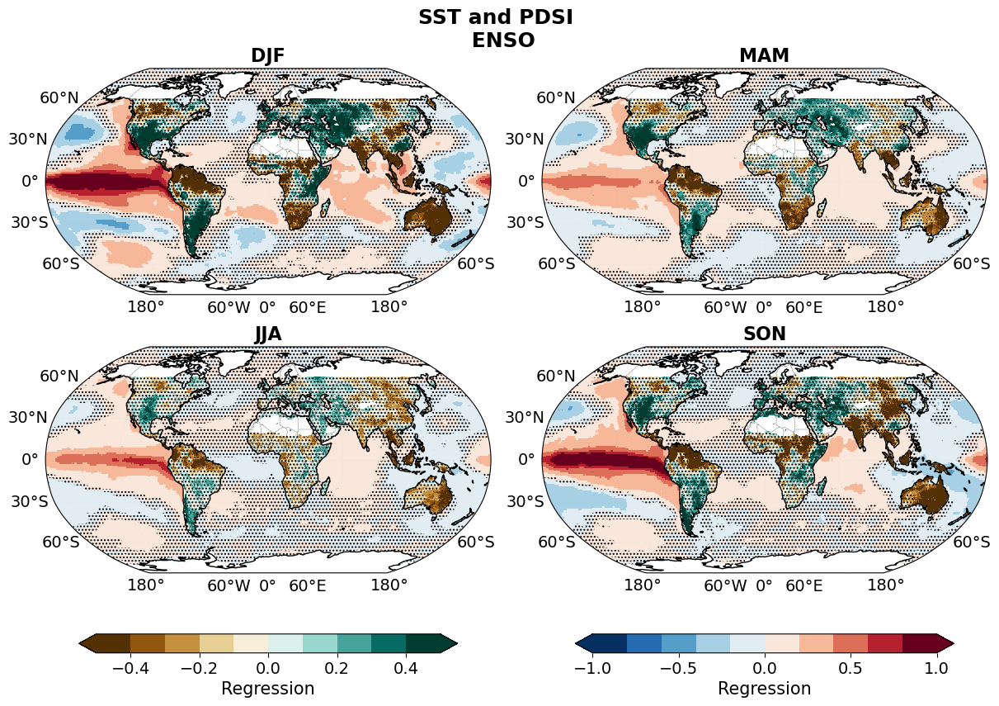

/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879

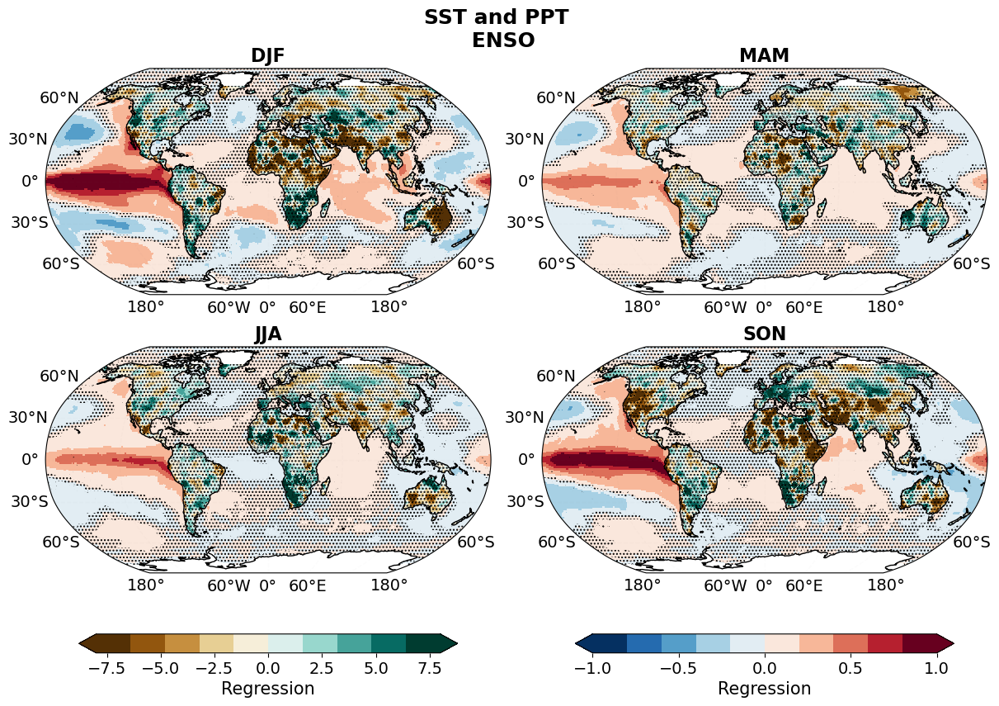

/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879

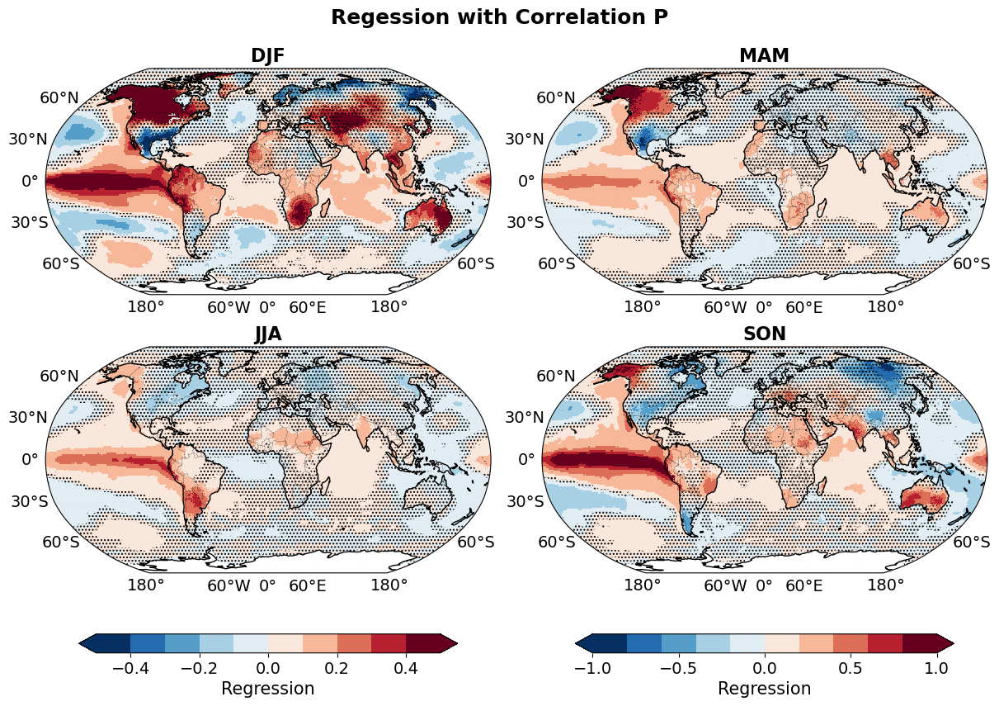

In [66]:
enso_reg_w_corr_p_pdsi_sst = compute_and_plot_reg_with_corrs_p_MOV(
    idx_values = sst_seasonal_indices_z.ENSO.groupby('time.season'),
    pdsi_anoms_seasonal = PDSI_Anom_1903_2023.pdsi_masked.groupby('time.season'),
    sst_anoms_seasonal = SST_Anom_1903_2023.sst_anom.groupby('time.season'),
    years=years_1903_2023,
    seasons=['DJF','MAM','JJA','SON'],
    cmap_pdsi='BrBG', vlim_pdsi=0.5,
    cmap_sst='RdBu_r', vlim_sst= 1,
    overall_title='SST and PDSI \n ENSO',
    #coeff_label='Correlation Coefficient'
)

enso_reg_w_corr_p_ppt_sst = compute_and_plot_reg_with_corrs_p_MOV(
    idx_values = sst_seasonal_indices_z.ENSO.groupby('time.season'),
    pdsi_anoms_seasonal = PPT_Anom_1903_2023.pre.groupby('time.season'),
    sst_anoms_seasonal = SST_Anom_1903_2023.sst_anom.groupby('time.season'),
    years=years_1903_2023,
    seasons=['DJF','MAM','JJA','SON'],
    cmap_pdsi='BrBG', vlim_pdsi=8,
    cmap_sst='RdBu_r', vlim_sst= 1,
    overall_title='SST and PPT \n ENSO',
    #coeff_label='Correlation Coefficient'
)

enso_reg_w_corr_p_tmp_sst = compute_and_plot_reg_with_corrs_p_MOV(
    idx_values = sst_seasonal_indices_z.ENSO.groupby('time.season'),
    pdsi_anoms_seasonal = TMP_Anom_1903_2023.tmp_anom.groupby('time.season'),
    sst_anoms_seasonal = SST_Anom_1903_2023.sst_anom.groupby('time.season'),
    years=years_1903_2023,
    seasons=['DJF','MAM','JJA','SON'],
    cmap_pdsi='RdBu_r', vlim_pdsi=0.5,
    cmap_sst='RdBu_r', vlim_sst= 1,
    overall_title='SST and TMP \n ENSO',

    #coeff_label='Correlation Coefficient'
)

In [136]:
def plot_three_row_four_season_regressions(
    all_results,                  # List of 3 result dicts
    var1_titles,                 # Titles for each row (e.g., ["IOD–PPT", "IOD–PDSI", "ENSO–PDSI"])
    var1_labels,                # Colorbar label for var1 in each row
    var1_cmaps, var1_vlims,     # Colormaps and vlim for var1
    sst_cmap, sst_vlim,         # Common SST colormap and vlim
    seasons=['DJF','MAM','JJA','SON'],
    overall_title="Lagged Regressions"
):
    proj = ccrs.Robinson()

    fig, axes = plt.subplots(
        3, 4, figsize=(22, 10),
        subplot_kw={'projection': proj},
        constrained_layout=False
    )
    plt.subplots_adjust(hspace=0.0, wspace=0.01)#, bottom=0.12)

    for row in range(3):
        results = all_results[row]
        for col, season in enumerate(seasons):
            ax = axes[row, col]
            ax.set_title(season if row == 0 else "", fontsize=16, fontweight = 'bold')
            ax.coastlines(resolution='110m', linewidth=0.8)
            ax.add_feature(cfeature.BORDERS, linewidth=0.3, linestyle=':')

            # Gridlines with selective labels
            gl = ax.gridlines(draw_labels=True, linewidth=0.2, color='gray',
                              alpha=0.3, linestyle='--')
            gl.top_labels = False
            gl.right_labels = False
            gl.left_labels = (col == 0)       # only left column
            gl.bottom_labels = (row == 2)     # only last row
            gl.xlabel_style = {"size": 9}
            gl.ylabel_style = {"size": 9}
            
            # === Get data for this subplot
            var1 = results['var1_reg'][col]
            sst  = results['sst_reg'][col]
            pval1 = results['var1_pvals'][col]
            pval_sst = results['sst_pvals'][col]

            # === Plot var1 (e.g., PDSI or PPT)
            lats1, lons1 = var1.lat, var1.lon
            lon1, lat1 = np.meshgrid(lons1, lats1)
            cmap1 = plt.get_cmap(var1_cmaps[row], 9)
            pcm1 = ax.pcolormesh(
                lon1, lat1, var1,
                cmap=cmap1, vmin=-var1_vlims[row], vmax=var1_vlims[row],
                transform=ccrs.PlateCarree()
            )

            # Stippling for var1
            nonsig1 = pval1 > 0.05
            ax.contourf(
                lon1, lat1, nonsig1,
                levels=[0.5, 1], colors='none',
                hatches=['....'], transform=ccrs.PlateCarree()
            )

            # === Plot SST contours (separate base grid)
            lats2, lons2 = sst.lat, sst.lon
            lon2, lat2 = np.meshgrid(lons2, lats2)
            cmap_sst_use = plt.get_cmap(sst_cmap, 9)

            ax.pcolormesh(
                lon2, lat2, sst,
                vmin=-sst_vlim, vmax=sst_vlim,
                cmap=cmap_sst_use, #linewidths=0.7,
                transform=ccrs.PlateCarree()
            )

            # Stippling for SST
            nonsig_sst = pval_sst > 0.05
            ax.contourf(
                lon2, lat2, nonsig_sst,
                levels=[0.5, 1], colors='none',
                hatches=['....'], transform=ccrs.PlateCarree()
            )

        # === Colorbar for var1 under each row
        cbar_ax = fig.add_axes([0.92, 0.73 - row * 0.31, 0.015, 0.18])
        cb = fig.colorbar(pcm1, cax=cbar_ax, extend="both")
        cb.set_label(var1_labels[row], fontsize=11)
        cb.ax.tick_params(labelsize=10)

    # === Common SST colorbar at the bottom
    sst_cb_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
    sm_sst = plt.cm.ScalarMappable(cmap=cmap_sst_use)
    sm_sst.set_array(np.linspace(-sst_vlim, sst_vlim, 256))
    cb_sst = plt.colorbar(sm_sst, cax=sst_cb_ax, orientation='horizontal', extend="both")
    cb_sst.set_label("SST Regression Coefficient", fontsize=12)
    cb_sst.ax.tick_params(labelsize=10)

    # === Main title
    fig.suptitle(overall_title, fontsize=25, weight="bold")#, y=0.98)
    plt.show()


In [148]:
def plot_three_row_four_season_regressions(
    all_results,                  # List of 3 result dicts
    var1_titles,                 # Titles for each row (e.g., ["IOD–PPT", "IOD–PDSI", "ENSO–PDSI"])
    var1_labels,                # Colorbar label for var1 in each row
    var1_cmaps, var1_vlims,     # Colormaps and vlim for var1
    sst_cmap, sst_vlim,         # Common SST colormap and vlim
    seasons=['DJF','MAM','JJA','SON'],
    overall_title="Lagged Regressions"
):
    proj = ccrs.Robinson()

    fig, axes = plt.subplots(
        3, 4, figsize=(22, 10),
        subplot_kw={'projection': proj},
        constrained_layout=False
    )
    plt.subplots_adjust(hspace=0.0, wspace=0.01)

    for row in range(3):
        results = all_results[row]
        for col, season in enumerate(seasons):
            ax = axes[row, col]
            ax.set_title(season if row == 0 else "", fontsize=16, fontweight='bold')
            ax.coastlines(resolution='110m', linewidth=0.8)
            ax.add_feature(cfeature.BORDERS, linewidth=0.3, linestyle=':')

            # Gridlines with selective labels
            gl = ax.gridlines(draw_labels=True, linewidth=0.2, color='gray',
                              alpha=0.3, linestyle='--')
            gl.top_labels = False
            gl.right_labels = False
            gl.left_labels = (col == 0)       # only left column
            gl.bottom_labels = (row == 2)     # only last row
            gl.xlabel_style = {"size": 9}
            gl.ylabel_style = {"size": 9}
            
            # === Get data for this subplot
            var1 = results['var1_reg'][col]
            sst  = results['sst_reg'][col]
            pval1 = results['var1_pvals'][col]
            pval_sst = results['sst_pvals'][col]

            # === Plot var1 (e.g., PDSI or PPT)
            lats1, lons1 = var1.lat, var1.lon
            lon1, lat1 = np.meshgrid(lons1, lats1)
            cmap1 = plt.get_cmap(var1_cmaps[row], 9)
            pcm1 = ax.pcolormesh(
                lon1, lat1, var1,
                cmap=cmap1, vmin=-var1_vlims[row], vmax=var1_vlims[row],
                transform=ccrs.PlateCarree()
            )

            # Stippling for var1
            nonsig1 = pval1 > 0.05
            ax.contourf(
                lon1, lat1, nonsig1,
                levels=[0.5, 1], colors='none',
                hatches=['....'], transform=ccrs.PlateCarree()
            )

            # === Plot SST
            lats2, lons2 = sst.lat, sst.lon
            lon2, lat2 = np.meshgrid(lons2, lats2)
            cmap_sst_use = plt.get_cmap(sst_cmap, 9)

            ax.pcolormesh(
                lon2, lat2, sst,
                vmin=-sst_vlim, vmax=sst_vlim,
                cmap=cmap_sst_use,
                transform=ccrs.PlateCarree()
            )

            # Stippling for SST
            nonsig_sst = pval_sst > 0.05
            ax.contourf(
                lon2, lat2, nonsig_sst,
                levels=[0.5, 1], colors='none',
                hatches=['....'], transform=ccrs.PlateCarree()
            )

        # === Row label (var1_titles) on the left of first column
        # axes[row, 0].set_ylabel(
        #     var1_titles[row],
        #     fontsize=14,
        #     fontweight='bold',
        #     rotation=90,        # vertical
        #     labelpad=40         # push it out from the axis
        # )

        for row in range(3):
            axes[row, 0].annotate(
                var1_titles[row],
                xy=(0, 0.5), xycoords='axes fraction',
                xytext=(-0.35, 0), textcoords='axes fraction',
                rotation=90, va='center', ha='center',
                fontsize=14, fontweight='bold'
        )

        # === Colorbar for var1 aligned with each row
        cbar_ax = fig.add_axes([0.92, 0.73 - row * 0.31, 0.015, 0.18])
        cb = fig.colorbar(pcm1, cax=cbar_ax, extend="both")
        cb.set_label(var1_labels[row], fontsize=11)
        cb.ax.tick_params(labelsize=10)

    # === Common SST colorbar at the bottom
    sst_cb_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
    sm_sst = plt.cm.ScalarMappable(cmap=cmap_sst_use)
    sm_sst.set_array(np.linspace(-sst_vlim, sst_vlim, 256))
    cb_sst = plt.colorbar(sm_sst, cax=sst_cb_ax, orientation='horizontal', extend="both")
    cb_sst.set_label("SST Regression Coefficient", fontsize=12)
    cb_sst.ax.tick_params(labelsize=10)

    # === Main title
    fig.suptitle(overall_title, fontsize=25, weight="bold")
    plt.show()


In [172]:
def plot_three_row_four_season_regressions(
    all_results,                  # List of 3 result dicts
    var1_titles,                 # Titles for each row (e.g., ["IOD–PPT", "IOD–PDSI", "ENSO–PDSI"])
    var1_labels,                # Colorbar label for var1 in each row
    var1_cmaps, var1_vlims,     # Colormaps and vlim for var1
    sst_cmap, sst_vlim,         # Common SST colormap and vlim
    seasons=['DJF','MAM','JJA','SON'],
    overall_title="Lagged Regressions"
):
    proj = ccrs.Robinson()

    fig, axes = plt.subplots(
        3, 4, figsize=(22, 10),
        subplot_kw={'projection': proj},
        constrained_layout=False
    )
    plt.subplots_adjust(hspace=0.0, wspace=0.01)

    for row in range(3):
        results = all_results[row]
        for col, season in enumerate(seasons):
            ax = axes[row, col]
            ax.set_title(season if row == 0 else "", fontsize=16, fontweight='bold')
            ax.coastlines(resolution='110m', linewidth=0.8)
            ax.add_feature(cfeature.BORDERS, linewidth=0.3, linestyle=':')

            # Gridlines with selective labels
            gl = ax.gridlines(draw_labels=True, linewidth=0.2, color='gray',
                              alpha=0.3, linestyle='--')
            gl.top_labels = False
            gl.right_labels = False
            gl.left_labels = (col == 0)       # only left column
            gl.bottom_labels = (row == 2)     # only last row
            gl.xlabel_style = {"size": 9}
            gl.ylabel_style = {"size": 9}
            
            # === Get data for this subplot
            var1 = results['var1_reg'][col]
            sst  = results['sst_reg'][col]
            pval1 = results['var1_pvals'][col]
            pval_sst = results['sst_pvals'][col]

            # === Plot var1 (e.g., PDSI or PPT)
            lats1, lons1 = var1.lat, var1.lon
            lon1, lat1 = np.meshgrid(lons1, lats1)
            cmap1 = plt.get_cmap(var1_cmaps[row], 9)
            pcm1 = ax.pcolormesh(
                lon1, lat1, var1,
                cmap=cmap1, vmin=-var1_vlims[row], vmax=var1_vlims[row],
                transform=ccrs.PlateCarree()
            )

            # Stippling for var1
            nonsig1 = pval1 > 0.05
            ax.contourf(
                lon1, lat1, nonsig1,
                levels=[0.5, 1], colors='none',
                hatches=['....'], transform=ccrs.PlateCarree()
            )

            # === Plot SST
            lats2, lons2 = sst.lat, sst.lon
            lon2, lat2 = np.meshgrid(lons2, lats2)
            cmap_sst_use = plt.get_cmap(sst_cmap, 9)

            ax.pcolormesh(
                lon2, lat2, sst,
                vmin=-sst_vlim, vmax=sst_vlim,
                cmap=cmap_sst_use,
                transform=ccrs.PlateCarree()
            )

            # Stippling for SST
            nonsig_sst = pval_sst > 0.05
            ax.contourf(
                lon2, lat2, nonsig_sst,
                levels=[0.5, 1], colors='none',
                hatches=['....'], transform=ccrs.PlateCarree()
            )


            axes[row, 0].annotate(
                var1_titles[row],
                xy=(0, 1.05), xycoords='axes fraction',
                xytext=(-0.15, 0.5), textcoords='axes fraction',
                rotation=90, va='center', ha='center',
                fontsize=14, fontweight='bold'
        )

        # === Colorbar for var1 aligned with each row
        cbar_ax = fig.add_axes([0.92, 0.73 - row * 0.31, 0.015, 0.18])
        cb = fig.colorbar(pcm1, cax=cbar_ax, extend="both")
        cb.set_label(var1_labels[row], fontsize=11)
        cb.ax.tick_params(labelsize=10)

    # === Common SST colorbar at the bottom
    sst_cb_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
    sm_sst = plt.cm.ScalarMappable(cmap=cmap_sst_use)
    sm_sst.set_array(np.linspace(-sst_vlim, sst_vlim, 256))
    cb_sst = plt.colorbar(sm_sst, cax=sst_cb_ax, orientation='horizontal', extend="both")
    cb_sst.set_label("SST Regression Coefficient", fontsize=12)
    cb_sst.ax.tick_params(labelsize=10)

    # === Main title
    fig.suptitle(overall_title, fontsize=25, weight="bold")
    plt.show()


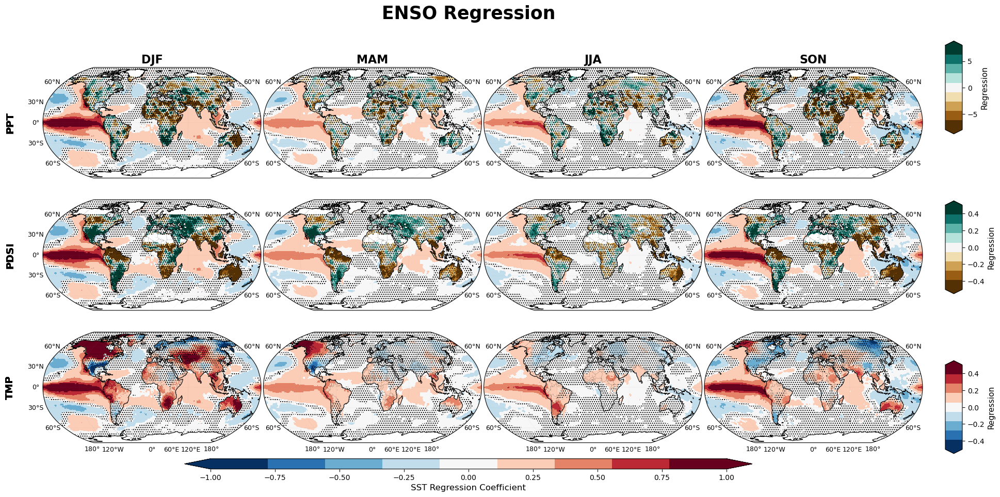

In [173]:
plot_three_row_four_season_regressions(
    all_results=[
        enso_reg_w_corr_p_ppt_sst,
        enso_reg_w_corr_p_pdsi_sst,
        enso_reg_w_corr_p_tmp_sst
    ],
    var1_titles=["PPT", "PDSI", "TMP"],
    var1_labels=["Regression", "Regression", "Regression"],
    var1_cmaps=["BrBG", "BrBG", "RdBu_r"],
    var1_vlims=[8, 0.5, 0.5],
    sst_cmap="RdBu_r",
    sst_vlim=1,
    overall_title="ENSO Regression"
)

## IOD

/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879

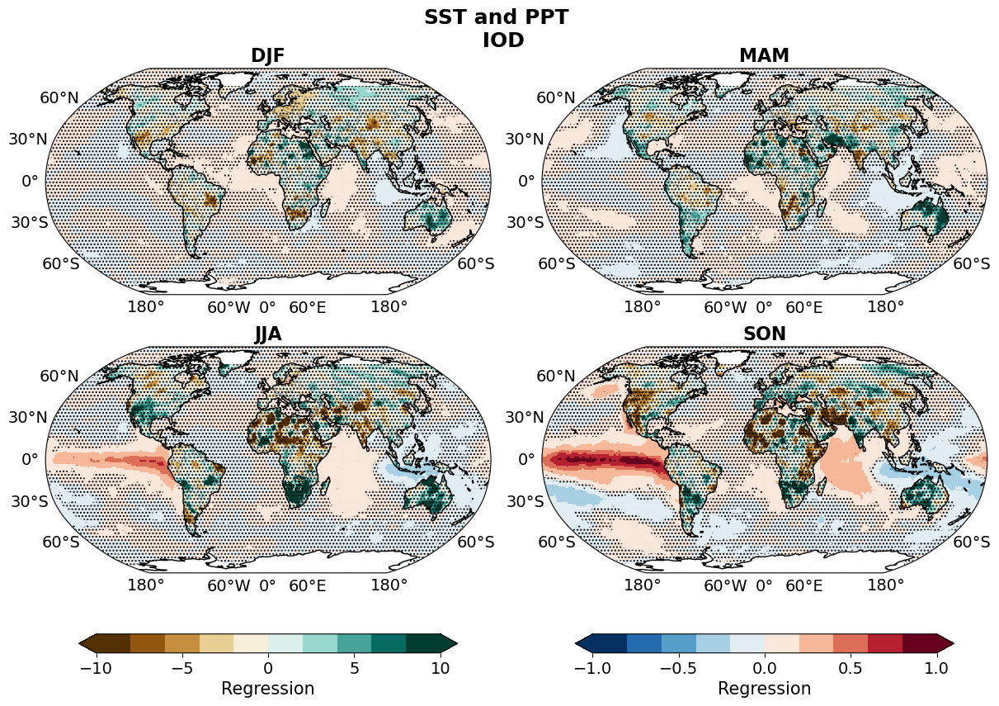

In [58]:
iod_reg_w_corr_p_ppt_sst = compute_and_plot_reg_with_corrs_p_MOV(
    idx_values = sst_seasonal_indices_z.IOD.groupby('time.season'),
    pdsi_anoms_seasonal = PPT_Anom_1903_2023.pre.groupby('time.season'),
    sst_anoms_seasonal = SST_Anom_1903_2023.sst_anom.groupby('time.season'),
    years=years_1903_2023,
    seasons=['DJF','MAM','JJA','SON'],
    cmap_pdsi='BrBG', vlim_pdsi=10,
    cmap_sst='RdBu_r', vlim_sst= 1,
    overall_title='SST and PPT \n IOD',
    #coeff_label='Correlation Coefficient'
)

/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879

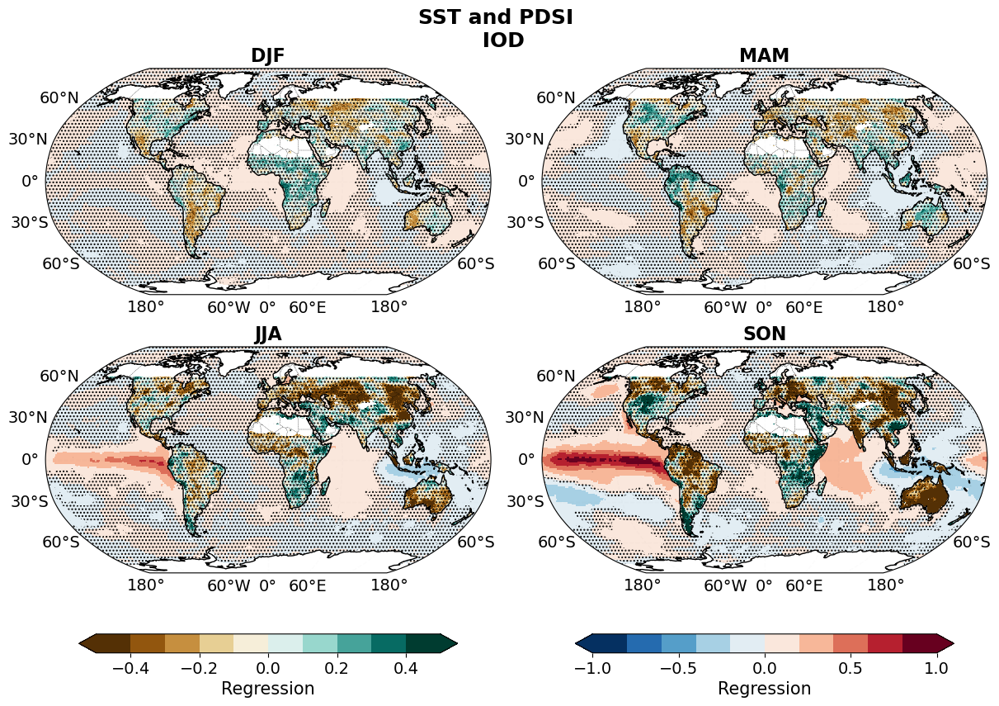

In [59]:
iod_reg_w_corr_p_pdsi_sst = compute_and_plot_reg_with_corrs_p_MOV(
    idx_values = sst_seasonal_indices_z.IOD.groupby('time.season'),
    pdsi_anoms_seasonal = PDSI_Anom_1903_2023.pdsi_masked.groupby('time.season'),
    sst_anoms_seasonal = SST_Anom_1903_2023.sst_anom.groupby('time.season'),
    years=years_1903_2023,
    seasons=['DJF','MAM','JJA','SON'],
    cmap_pdsi='BrBG', vlim_pdsi=0.5,
    cmap_sst='RdBu_r', vlim_sst= 1,
    overall_title='SST and PDSI \n IOD',
    #coeff_label='Correlation Coefficient'
)

/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879

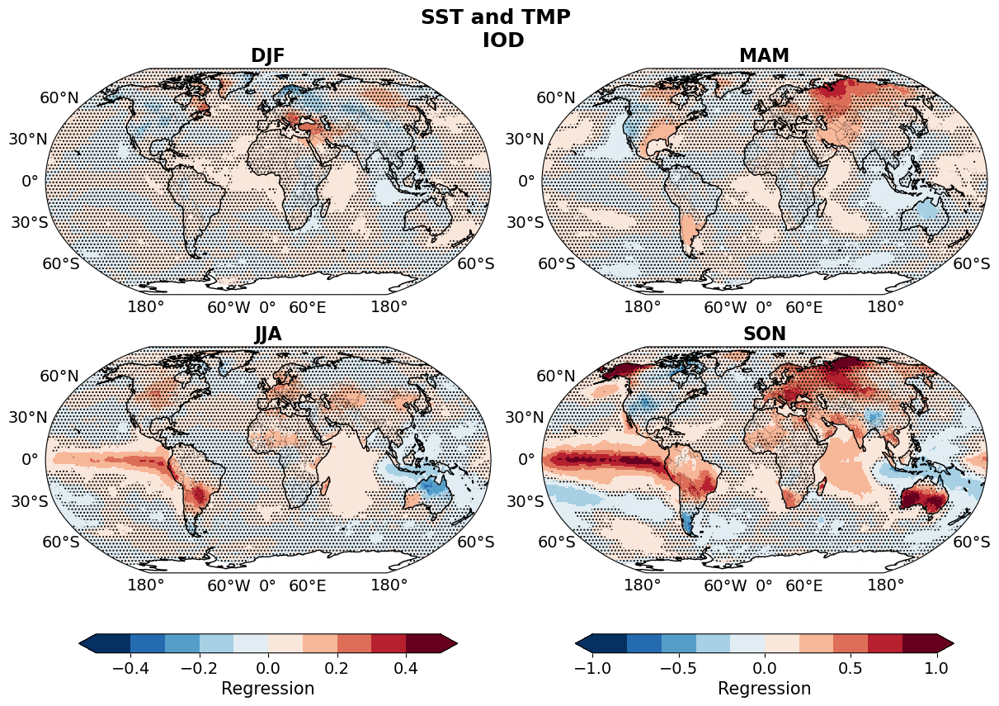

In [60]:
iod_reg_w_corr_p_tmp_sst = compute_and_plot_reg_with_corrs_p_MOV(
    idx_values = sst_seasonal_indices_z.IOD.groupby('time.season'),
    pdsi_anoms_seasonal = TMP_Anom_1903_2023.tmp_anom.groupby('time.season'),
    sst_anoms_seasonal = SST_Anom_1903_2023.sst_anom.groupby('time.season'),
    years=years_1903_2023,
    seasons=['DJF','MAM','JJA','SON'],
    cmap_pdsi='RdBu_r', vlim_pdsi=0.5,
    cmap_sst='RdBu_r', vlim_sst= 1,
    overall_title='SST and TMP \n IOD',
    #coeff_label='Correlation Coefficient'
)

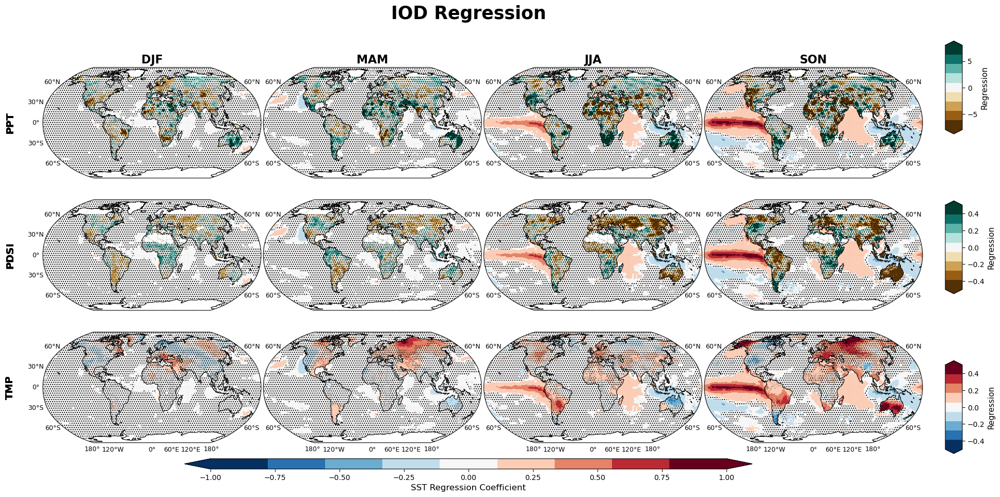

In [185]:
plot_three_row_four_season_regressions(
    all_results=[
        iod_reg_w_corr_p_ppt_sst,
        iod_reg_w_corr_p_pdsi_sst,
        iod_reg_w_corr_p_tmp_sst
    ],
    var1_titles=["PPT", "PDSI", "TMP"],
    var1_labels=["Regression", "Regression", "Regression"],
    var1_cmaps=["BrBG", "BrBG", "RdBu_r"],
    var1_vlims=[8, 0.5, 0.5],
    sst_cmap="RdBu_r",
    sst_vlim=1,
    overall_title="IOD Regression"
)


## PDO

/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879

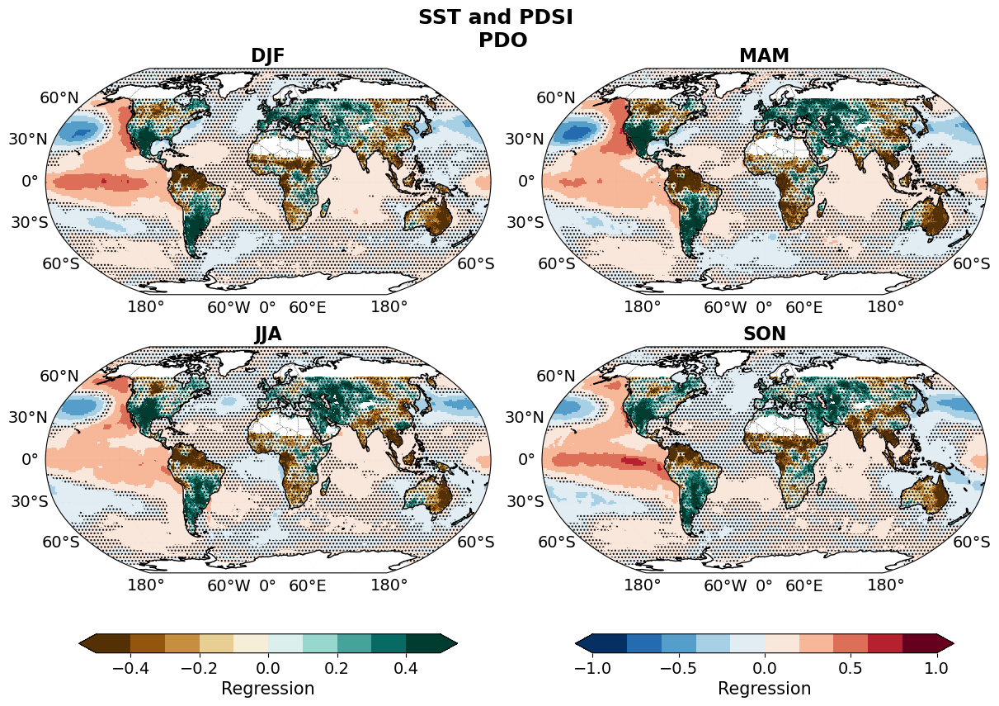

/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879

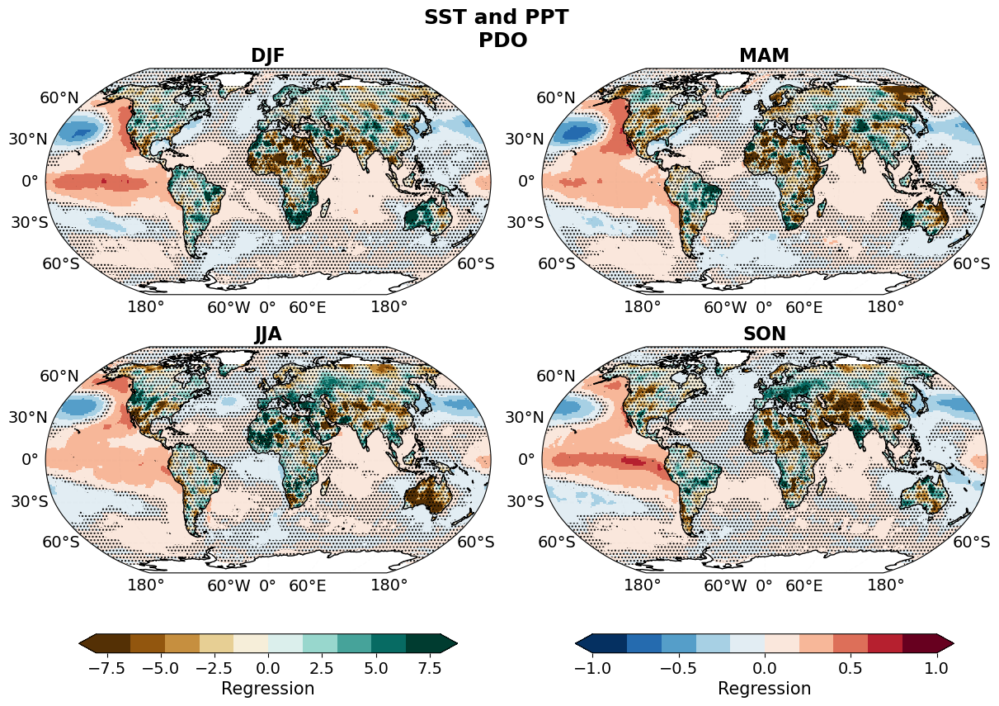

/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879

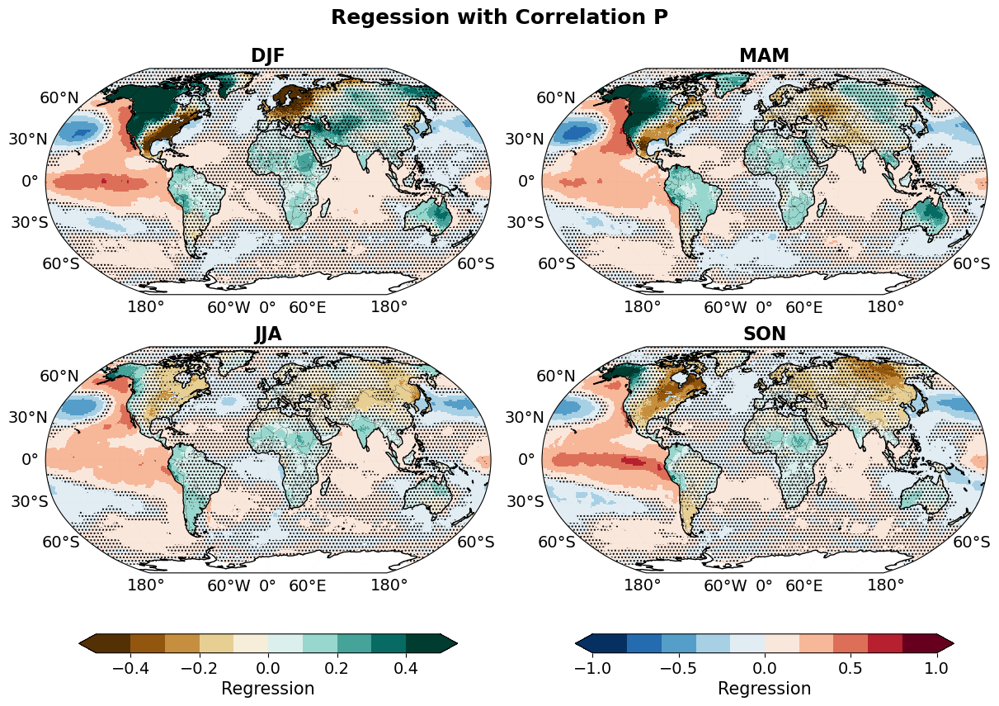

In [64]:
pdo_reg_w_corr_p_pdsi_sst = compute_and_plot_reg_with_corrs_p_MOV(
    idx_values = sst_seasonal_indices_z.PDO.groupby('time.season'),
    pdsi_anoms_seasonal = PDSI_Anom_1903_2023.pdsi_masked.groupby('time.season'),
    sst_anoms_seasonal = SST_Anom_1903_2023.sst_anom.groupby('time.season'),
    years=years_1903_2023,
    seasons=['DJF','MAM','JJA','SON'],
    cmap_pdsi='BrBG', vlim_pdsi=0.5,
    cmap_sst='RdBu_r', vlim_sst= 1,
    overall_title='SST and PDSI \n PDO',
    #coeff_label='Correlation Coefficient'
)

pdo_reg_w_corr_p_ppt_sst = compute_and_plot_reg_with_corrs_p_MOV(
    idx_values = sst_seasonal_indices_z.PDO.groupby('time.season'),
    pdsi_anoms_seasonal = PPT_Anom_1903_2023.pre.groupby('time.season'),
    sst_anoms_seasonal = SST_Anom_1903_2023.sst_anom.groupby('time.season'),
    years=years_1903_2023,
    seasons=['DJF','MAM','JJA','SON'],
    cmap_pdsi='BrBG', vlim_pdsi=8,
    cmap_sst='RdBu_r', vlim_sst= 1,
    overall_title='SST and PPT \n PDO',
    #coeff_label='Correlation Coefficient'
)

In [ ]:
pdo_reg_w_corr_p_tmp_sst = compute_and_plot_reg_with_corrs_p_MOV(
    idx_values = sst_seasonal_indices_z.PDO.groupby('time.season'),
    pdsi_anoms_seasonal = TMP_Anom_1903_2023.tmp_anom.groupby('time.season'),
    sst_anoms_seasonal = SST_Anom_1903_2023.sst_anom.groupby('time.season'),
    years=years_1903_2023,
    seasons=['DJF','MAM','JJA','SON'],
    cmap_pdsi='RdBu_r', vlim_pdsi=0.5,
    cmap_sst='RdBu_r', vlim_sst= 1,
    overall_title='SST and TMP \n PDO',
    #coeff_label='Correlation Coefficient'
)

/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879

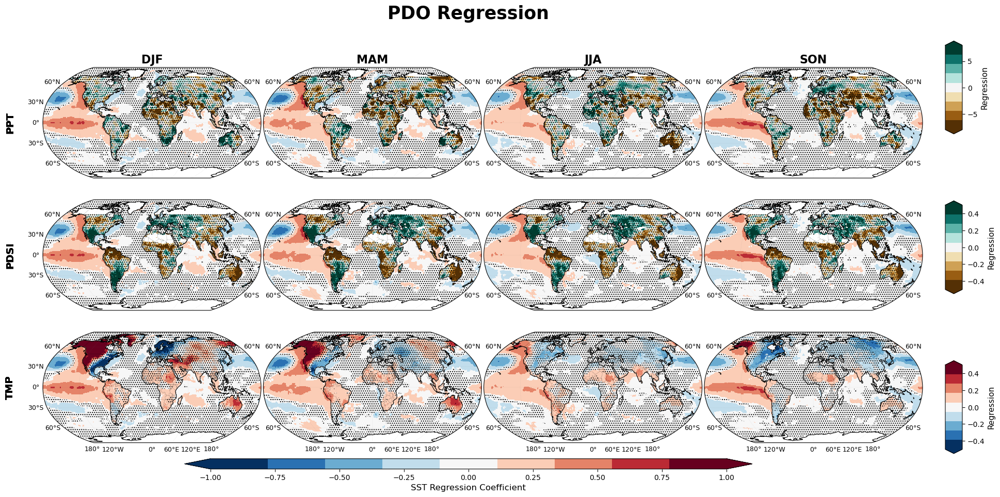

In [180]:
plot_three_row_four_season_regressions(
    all_results=[
        pdo_reg_w_corr_p_ppt_sst,
        pdo_reg_w_corr_p_pdsi_sst,
        pdo_reg_w_corr_p_tmp_sst
    ],
    var1_titles=["PPT", "PDSI", "TMP"],
    var1_labels=["Regression", "Regression", "Regression"],
    var1_cmaps=["BrBG", "BrBG", "RdBu_r"],
    var1_vlims=[8, 0.5, 0.5],
    sst_cmap="RdBu_r",
    sst_vlim=1,
    overall_title="PDO Regression"
)

## AMO

/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879

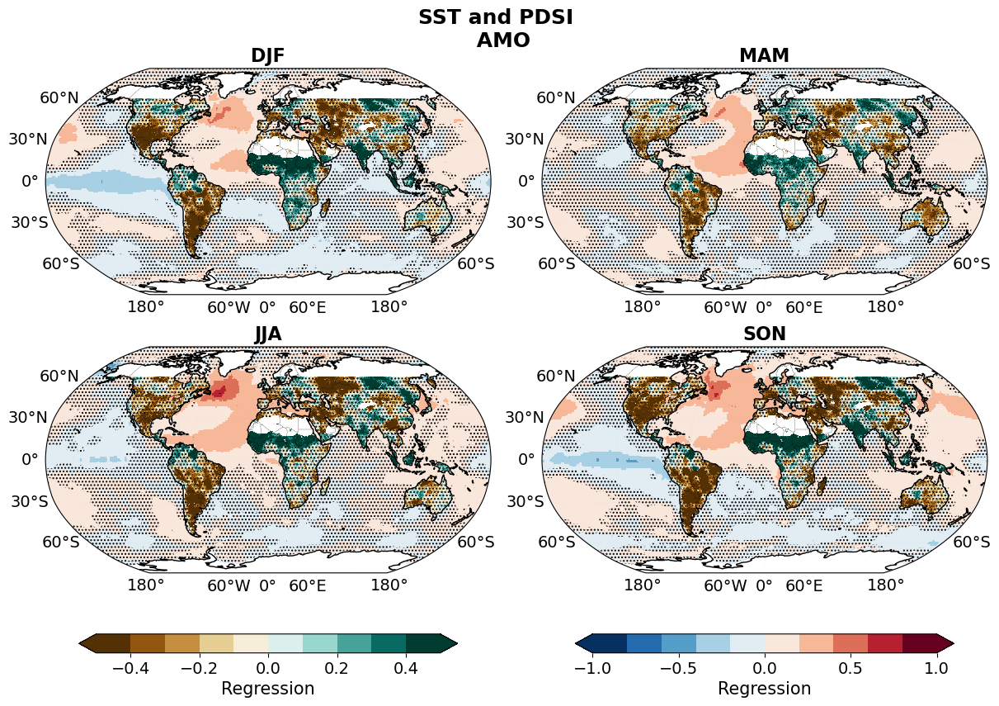

/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879

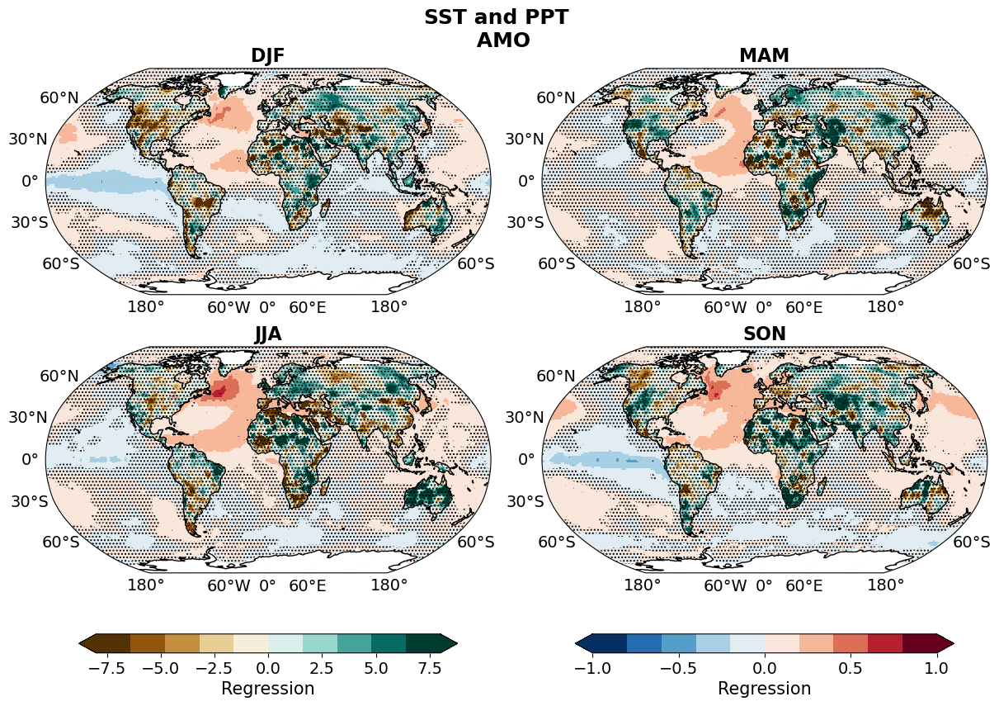

/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,
/usr/local/python/miniconda3/envs/pangeo-Jul2024/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1879

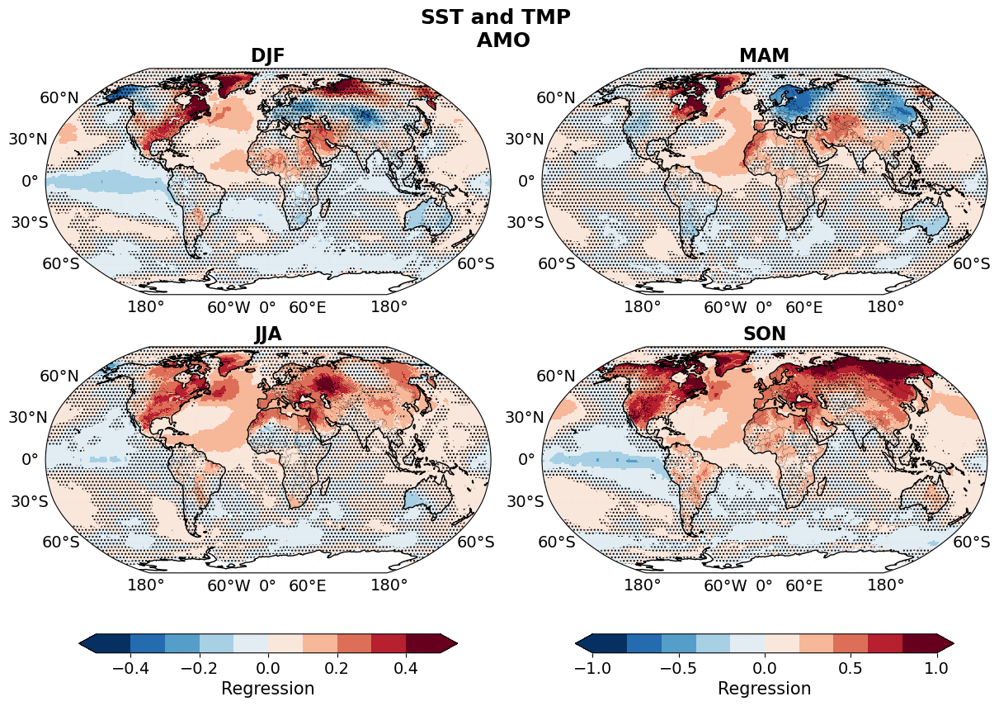

In [183]:
amo_reg_w_corr_p_pdsi_sst = compute_and_plot_reg_with_corrs_p_MOV(
    idx_values = sst_seasonal_indices_z.AMO.groupby('time.season'),
    pdsi_anoms_seasonal = PDSI_Anom_1903_2023.pdsi_masked.groupby('time.season'),
    sst_anoms_seasonal = SST_Anom_1903_2023.sst_anom.groupby('time.season'),
    years=years_1903_2023,
    seasons=['DJF','MAM','JJA','SON'],
    cmap_pdsi='BrBG', vlim_pdsi=0.5,
    cmap_sst='RdBu_r', vlim_sst= 1,
    overall_title='SST and PDSI \n AMO',
    #coeff_label='Correlation Coefficient'
)

amo_reg_w_corr_p_ppt_sst = compute_and_plot_reg_with_corrs_p_MOV(
    idx_values = sst_seasonal_indices_z.AMO.groupby('time.season'),
    pdsi_anoms_seasonal = PPT_Anom_1903_2023.pre.groupby('time.season'),
    sst_anoms_seasonal = SST_Anom_1903_2023.sst_anom.groupby('time.season'),
    years=years_1903_2023,
    seasons=['DJF','MAM','JJA','SON'],
    cmap_pdsi='BrBG', vlim_pdsi=8,
    cmap_sst='RdBu_r', vlim_sst= 1,
    overall_title='SST and PPT \n AMO',
    #coeff_label='Correlation Coefficient'
)

amo_reg_w_corr_p_tmp_sst = compute_and_plot_reg_with_corrs_p_MOV(
    idx_values = sst_seasonal_indices_z.AMO.groupby('time.season'),
    pdsi_anoms_seasonal = TMP_Anom_1903_2023.tmp_anom.groupby('time.season'),
    sst_anoms_seasonal = SST_Anom_1903_2023.sst_anom.groupby('time.season'),
    years=years_1903_2023,
    seasons=['DJF','MAM','JJA','SON'],
    cmap_pdsi='RdBu_r', vlim_pdsi=0.5,
    cmap_sst='RdBu_r', vlim_sst= 1,
    overall_title='SST and TMP \n AMO',

    #coeff_label='Correlation Coefficient'
)

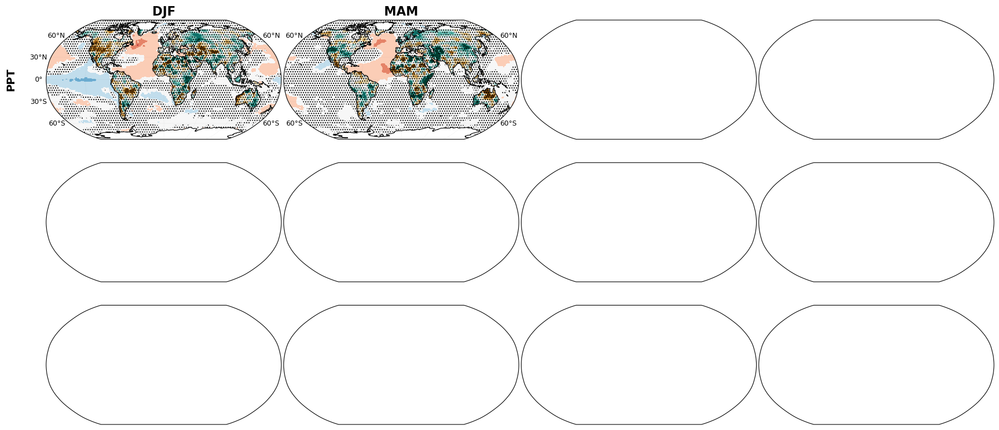

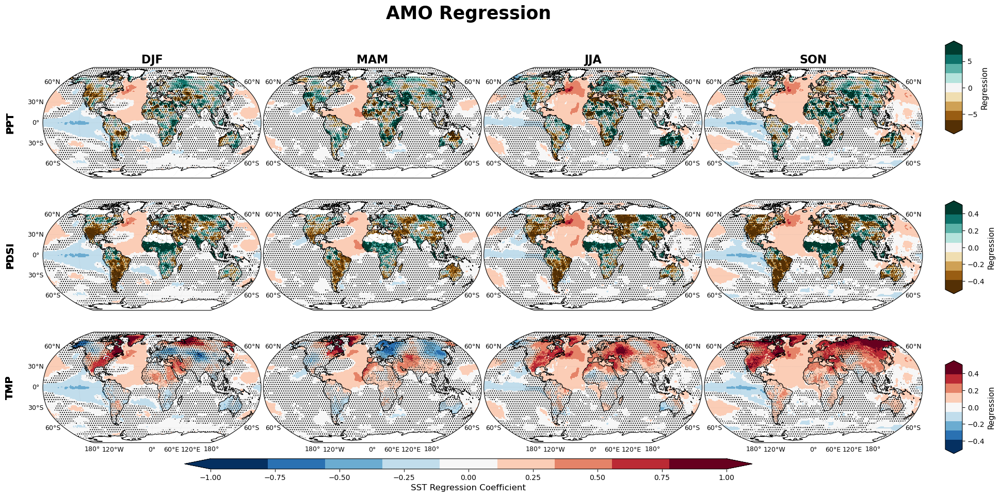

In [189]:
plot_three_row_four_season_regressions(
    all_results=[
        amo_reg_w_corr_p_ppt_sst,
        amo_reg_w_corr_p_pdsi_sst,
        amo_reg_w_corr_p_tmp_sst
    ],
    var1_titles=["PPT", "PDSI", "TMP"],
    var1_labels=["Regression", "Regression", "Regression"],
    var1_cmaps=["BrBG", "BrBG", "RdBu_r"],
    var1_vlims=[8, 0.5, 0.5],
    sst_cmap="RdBu_r",
    sst_vlim=1,
    overall_title="AMO Regression"
)

# Lagged

In [191]:
import numpy as np
import xarray as xr
from scipy import stats

SEASON_ORDER = ["DJF", "MAM", "JJA", "SON"]

# ---------- small helpers ----------
def _season_shift(s: str, lag: int) -> str:
    """Return the season shifted BACK by lag (lag=1 => previous season)."""
    i = SEASON_ORDER.index(s)
    return SEASON_ORDER[(i - lag) % 4]

def detrend_dim(da: xr.DataArray, dim: str) -> xr.DataArray:
    """Least-squares linear detrend along `dim`."""
    x = xr.apply_ufunc(
        lambda t: np.arange(t.size, dtype=float),
        da[dim],
        vectorize=False,
        dask="parallelized",
        output_dtypes=[float],
    )
    # mask finite
    mask = xr.apply_ufunc(np.isfinite, da, dask="parallelized", output_dtypes=[bool])
    x = xr.where(mask, x, np.nan)

    # compute slope & intercept
    xm = x.mean(dim, skipna=True)
    ym = da.mean(dim, skipna=True)
    cov = ((x - xm) * (da - ym)).mean(dim, skipna=True)
    var = ((x - xm) ** 2).mean(dim, skipna=True)
    slope = cov / var
    intercept = ym - slope * xm

    trend = slope * x + intercept
    return da - trend

def linear_reg_with_corr_p(x_1d: np.ndarray, Y: xr.DataArray, time_coord) -> tuple[xr.DataArray, xr.DataArray, xr.DataArray]:
    """
    Regress each gridcell Y ~ x (no explicit intercept; stats.linregress has it).
    Returns (slope, r, p) as DataArrays with the spatial dims of Y (time removed).
    """
    # ensure finite
    x = np.asarray(x_1d, dtype=float)
    x_mask = np.isfinite(x)

    def _cell_reg(y):
        y = np.asarray(y, dtype=float)
        m = np.isfinite(y) & x_mask
        n = int(m.sum())
        if n < 3:
            return np.array([np.nan, np.nan, np.nan], dtype=float)
        res = stats.linregress(x[m], y[m])
        return np.array([res.slope, res.rvalue, res.pvalue], dtype=float)

    reg = xr.apply_ufunc(
        _cell_reg, Y,
        input_core_dims=[["time"]],
        output_core_dims=[["stat"]],
        vectorize=True,
        dask="parallelized",
        output_dtypes=[float],
    )
    reg = reg.assign_coords(stat=["slope", "r", "p"])
    slope = reg.sel(stat="slope").drop_vars("stat")
    r     = reg.sel(stat="r").drop_vars("stat")
    p     = reg.sel(stat="p").drop_vars("stat")
    return slope, r, p

# # ---- optional plotting (uses your existing function signature) ----
# def four_reg_plot_with_sig(var, var_cmap, var_vval,
#                            var_2, var_cmap_2, var_vval_2,
#                            pvals1, pvals2,  # lists of DA
#                            val_sel_titles, overall_title,
#                            var_label):
#     """Stub: uses your existing implementation. Keep your version if you have one."""
#     # If you already have this function elsewhere, remove this stub.
#     import matplotlib.pyplot as plt
#     fig = plt.figure(figsize=(10, 3))
#     plt.suptitle(overall_title)
#     plt.text(0.02, 0.5, "four_reg_plot_with_sig stub\n(plug in your full version)", transform=fig.transFigure)
#     plt.show()

# ---------- main function ----------
def compute_lagged_seasonal_regression_and_plot(
    idx_values,                   # 1D seasonal index as DataArray with 'time' and 'time.season'
    pdsi_anoms_seasonal,          # 3D field (time, lat, lon) with 'time.season'
    sst_anoms_seasonal,           # 3D field (time, lat, lon) with 'time.season'
    years=None,                   # optional (start, end) or iterable of years to keep
    seasons=['DJF', 'MAM', 'JJA', 'SON'],
    lag_seasons=1,                # previous season by default
    cmap_pdsi='BrBG', vlim_pdsi=0.5,
    cmap_sst='RdBu_r', vlim_sst=1.0,
    overall_title="Lagged Seasonal Regression",
    coeff_label="Regression Coefficient",
    do_plot=True
):
    """
    For each target season S, regress PDSI/SST at S on the INDEX from S - lag.
    Handles detrending and strict time intersection. Returns dict of lists by season order.
    """
    # ensure we have time.season coords (if inputs are already grouped, pick their DataArray)
    def _ensure_da(obj):
        return obj.data if hasattr(obj, "data") and isinstance(obj.data, xr.DataArray) else obj

    idx_values = _ensure_da(idx_values)
    pdsi_anoms_seasonal = _ensure_da(pdsi_anoms_seasonal)
    sst_anoms_seasonal  = _ensure_da(sst_anoms_seasonal)

    # Optional year filter
    def _year_filter(da):
        if years is None:
            return da
        if isinstance(years, tuple) and len(years) == 2:
            y0, y1 = years
            return da.sel(time=slice(f"{y0}-01-01", f"{y1}-12-31"))
        else:
            # assume iterable of ints
            return da.sel(time=da["time"].dt.year.isin(list(years)))

    idx_values = _year_filter(idx_values)
    pdsi_anoms_seasonal = _year_filter(pdsi_anoms_seasonal)
    sst_anoms_seasonal  = _year_filter(sst_anoms_seasonal)

    pdsi_reg_dt, sst_reg_dt = [], []
    pdsi_pvals_dt, sst_pvals_dt = [], []
    dual_sel_titles = []

    # NOTE: direction fix — predictor is the *previous* season by default
    for s in seasons:
        pred_s = _season_shift(s, lag_seasons)

        # Select seasons
        idx_season  = idx_values.where(idx_values["time.season"] == pred_s, drop=True)
        pdsi_season = pdsi_anoms_seasonal.where(pdsi_anoms_seasonal["time.season"] == s, drop=True)
        sst_season  = sst_anoms_seasonal.where(sst_anoms_seasonal["time.season"] == s, drop=True)

        # Common time alignment (strict intersection)
        common_time = np.intersect1d(
            np.intersect1d(idx_season.time.values, pdsi_season.time.values),
            sst_season.time.values
        )

        if common_time.size < 3:
            print(f"⚠️ Skipping {s} ← {pred_s}: only {common_time.size} overlapping years.")
            # shape-safe NaNs
            _tmpl = pdsi_season.isel(time=0, drop=True)
            pdsi_reg_dt.append(xr.full_like(_tmpl, np.nan))
            sst_reg_dt.append(xr.full_like(sst_season.isel(time=0, drop=True), np.nan))
            pdsi_pvals_dt.append(xr.full_like(_tmpl, np.nan))
            sst_pvals_dt.append(xr.full_like(sst_season.isel(time=0, drop=True), np.nan))
            dual_sel_titles.append(f"{s} ← {pred_s}")
            continue

        # Restrict to shared time
        idx_season  = idx_season.sel(time=common_time)
        pdsi_season = pdsi_season.sel(time=common_time)
        sst_season  = sst_season.sel(time=common_time)

        # Detrend both predictor and predictands
        idx_array = detrend_dim(idx_season, "time").values
        pdsi_dt   = detrend_dim(pdsi_season, "time")
        sst_dt    = detrend_dim(sst_season, "time")

        # Regress grid cells on index
        pdsi_slope, pdsi_r, p_pdsi = linear_reg_with_corr_p(idx_array, pdsi_dt, common_time)
        sst_slope,  sst_r,  p_sst  = linear_reg_with_corr_p(idx_array, sst_dt,  common_time)

        pdsi_reg_dt.append(pdsi_slope)
        sst_reg_dt.append(sst_slope)
        pdsi_pvals_dt.append(p_pdsi)
        sst_pvals_dt.append(p_sst)

        print(f"✅ {s} ← {pred_s} | {common_time.size} years")
        dual_sel_titles.append(f"{s} ← {pred_s}")

    if do_plot:
        four_reg_plot_with_sig(
            pdsi_reg_dt, cmap_pdsi, vlim_pdsi,
            sst_reg_dt,  cmap_sst,  vlim_sst,
            pdsi_pvals_dt, sst_pvals_dt,
            dual_sel_titles,
            overall_title,
            coeff_label,
        )

    return {
        "var1_reg":  pdsi_reg_dt,
        "sst_reg":   sst_reg_dt,
        "var1_pvals": pdsi_pvals_dt,
        "sst_pvals":  sst_pvals_dt,
        "titles":     dual_sel_titles,
    }


# --- thin wrapper to match your later call name exactly ---
def compute_seasonal_lagged_regressions(**kwargs):
    return compute_lagged_seasonal_regression_and_plot(**kwargs)

✅ DJF ← DJF | 120 years
✅ MAM ← MAM | 121 years
✅ JJA ← JJA | 121 years
✅ SON ← SON | 121 years


/tmp/ipykernel_26406/1030644912.py:17: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  plt.subplots_adjust(hspace=0.0, wspace=0.0)


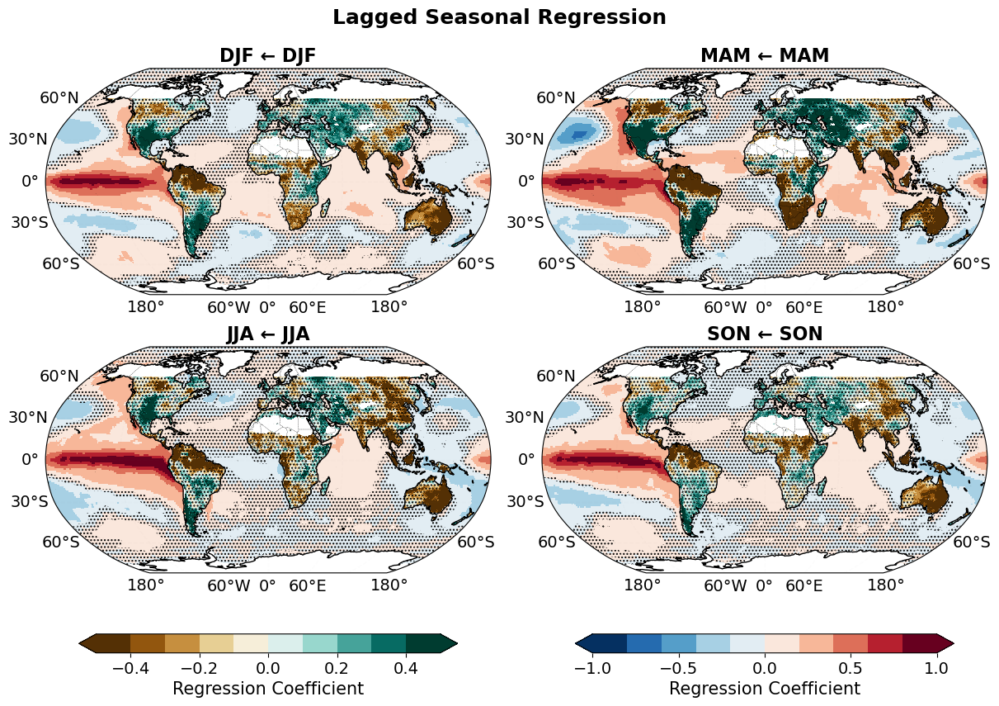

In [195]:
enso_lagged_reg = compute_seasonal_lagged_regressions(
    idx_values = sst_seasonal_indices_z.ENSO,               # 1D DA with 'time' and 'time.season'
    pdsi_anoms_seasonal = PDSI_Anom_1903_2023.pdsi_masked,  # 3D DA with 'time' and 'time.season'
    sst_anoms_seasonal  = SST_Anom_1903_2023.sst_anom,      # 3D DA with 'time' and 'time.season'
    years = (1903, 2023),
    seasons = ['DJF', 'MAM', 'JJA', 'SON'],
    lag_seasons = 0,   # set to 1 for "previous season" predictor
)

# Bottom

In [ ]:
# def plot_three_row_four_season_regressions(
#     all_results,                  # List of 3 result dicts
#     var1_titles,                 # Titles for each row (e.g., ["IOD–PPT", "IOD–PDSI", "ENSO–PDSI"])
#     var1_labels,                # Colorbar label for var1 in each row
#     var1_cmaps, var1_vlims,     # Colormaps and vlim for var1
#     sst_cmap, sst_vlim,         # Common SST colormap and vlim
#     seasons=['DJF','MAM','JJA','SON'],
#     overall_title="Lagged Regressions"
# ):
#     proj = ccrs.Robinson()
#     fig, axes = plt.subplots(
#         3, 4, figsize=(22, 12),
#         subplot_kw={'projection': proj},
#         constrained_layout=False
#     )

#     plt.subplots_adjust(hspace=0.15, wspace=0.05, bottom=0.12)

#     for row in range(3):
#         results = all_results[row]
#         for col, season in enumerate(seasons):
#             ax = axes[row, col]
#             ax.set_title(season if row == 0 else "", fontsize=14)
#             ax.coastlines(resolution='110m', linewidth=0.8)
#             ax.add_feature(cfeature.BORDERS, linewidth=0.3, linestyle=':')

#             gl = ax.gridlines(draw_labels=False, linewidth=0.2, color='gray', alpha=0.3, linestyle='--')

#             # Get relevant data
#             var1 = results['var1_reg'][col]
#             sst  = results['sst_reg'][col]
#             pval1 = results['var1_pvals'][col]
#             pval_sst = results['sst_pvals'][col]

#             lats, lons = var1.lat, var1.lon
#             lon_grid, lat_grid = np.meshgrid(lons, lats)

#             # Plot var1
#             cmap1 = plt.get_cmap(var1_cmaps[row])
#             pcm1 = ax.pcolormesh(lon_grid, lat_grid, var1,
#                                  cmap=cmap1, vmin=-var1_vlims[row], vmax=var1_vlims[row],
#                                  transform=ccrs.PlateCarree())

#             # Stippling for var1
#             nonsig1 = pval1 > 0.05
#             ax.contourf(lon_grid, lat_grid, nonsig1,
#                         levels=[0.5, 1], colors='none', hatches=['....'],
#                         transform=ccrs.PlateCarree())

#             # Overlay SST
#             sst_cmap_use = plt.get_cmap(sst_cmap)
#             ax.contour(lon_grid, lat_grid, sst,
#                        levels=np.linspace(-sst_vlim, sst_vlim, 9),
#                        cmap=sst_cmap_use, linewidths=0.7, transform=ccrs.PlateCarree())

#             # Stippling for SST
#             nonsig_sst = pval_sst > 0.05
#             ax.contourf(lon_grid, lat_grid, nonsig_sst,
#                         levels=[0.5, 1], colors='none', hatches=['xxxx'],
#                         transform=ccrs.PlateCarree())

#         # Colorbar for var1 under each row
#         cbar_ax = fig.add_axes([0.92, 0.73 - row*0.28, 0.015, 0.18])
#         cb = fig.colorbar(pcm1, cax=cbar_ax)
#         cb.set_label(var1_labels[row], fontsize=11)
#         cb.ax.tick_params(labelsize=10)

#     # SST colorbar (shared, large, bottom)
#     sst_cb_ax = fig.add_axes([0.25, 0.08, 0.5, 0.02])
#     sm_sst = plt.cm.ScalarMappable(cmap=sst_cmap_use)
#     sm_sst.set_array(np.linspace(-sst_vlim, sst_vlim, 256))
#     cbsst = plt.colorbar(sm_sst, cax=sst_cb_ax, orientation='horizontal')
#     cbsst.set_label("SST Regression Coefficient", fontsize=12)
#     cbsst.ax.tick_params(labelsize=10)

#     fig.suptitle(overall_title, fontsize=18, weight="bold", y=0.98)
#     plt.show()

